In [1]:
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN

In [14]:
import pyproj
geod = pyproj.Geod(ellps='WGS84')

def distn(x,y):
    distance_meter = geod.inv(x[1], x[0], y[1], y[0])[2]
    return distance_meter


def stayPointExtraction(file, velThres = 0.08):
    op = 0
    sp_df =[]
    df = pd.read_csv (file,usecols= ['path number','lat','long',"name","type"])
    # dftr=pd.DataFrame()
    # for pn in range (1,df['path number'].max()+1):
    #     temp = pd.DataFrame()
    #     tdf = df [df['path number'] == pn].copy() 
    #     tdf = tdf.reset_index(drop = True)
    #     pointNum = len (tdf)
    #     i = 0
    #     while i < pointNum-1: 
    #         j = i
    #         while j < pointNum:   
    #             vel = tdf.loc[j,'velocity']
    #             if vel > velThres:
    #                 temp =pd.concat([ temp,tdf[i:j]], ignore_index = True)
    #                 i = j
    #                 break
    #             else:
    #                 op = op + 1
    #             j += 1
    #         i += 1
    #     # print(temp)
    #     if len(temp) == 0:
    #         continue
    co = pd.isna(df["name"]) & df["path number"] == 1
    temp = df[co].copy()
    temp[['lat', 'long']] = temp[['lat', 'long']].apply(pd.to_numeric, errors='coerce')

    X = temp[['lat', 'long']].values
    print(X)
    dbscan = DBSCAN(eps=10, min_samples=5, metric= distn) 
    clusters = dbscan.fit_predict(X)
    # labels = dbscan.labels_
    
    # temp['cl']  = labels
    # n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    # n_noise_ = list(labels).count(-1)
    # print(len(temp))
    # print('Estimated number of clusters: %d' % n_clusters_)
    cluster_centroids = {}
    for cluster_label in np.unique(clusters):
        if cluster_label != -1:  # Ignore noise points
            cluster_points = temp.loc[clusters == cluster_label, ['lat','long']]
            print(cluster_points)
            centroid = np.mean(cluster_points, axis=0)
            cluster_centroids[cluster_label] = centroid
    # print('Estimated number of noise points: %d' % n_noise_)
    # dftr = pd.concat([dftr,temp] , ignore_index = True)
    return cluster_centroids

In [15]:
lis = stayPointExtraction(r"C:\Users\Deepanshu Sharma\Desktop\geolife\out\003.csv",velThres = 0.71)

[[ 39.994866 116.326458]
 [ 39.994743 116.326447]
 [ 39.994608 116.326406]
 ...
 [ 39.994688 116.326789]
 [ 39.994838 116.326782]
 [ 39.994974 116.32679 ]]
              lat        long
2001    39.994866  116.326458
2002    39.994743  116.326447
2003    39.994608  116.326406
2004    39.994489  116.326378
2005    39.994407  116.326405
...           ...         ...
482761  39.994326  116.326562
482846  39.994550  116.326799
482847  39.994688  116.326789
482848  39.994838  116.326782
482849  39.994974  116.326790

[1333 rows x 2 columns]
              lat        long
2015    39.993275  116.325924
2016    39.993124  116.325903
2017    39.992961  116.325874
2019    39.992604  116.325781
2020    39.992462  116.325788
...           ...         ...
440244  39.992045  116.326124
440245  39.991951  116.326002
440246  39.991846  116.325985
440247  39.991815  116.326024
440248  39.991766  116.326119

[214 rows x 2 columns]
              lat        long
2032    39.991087  116.326075
2033    39.9909

In [20]:
len(lis)

1233

In [10]:
lis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4477 entries, 0 to 4476
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   lat          4477 non-null   float64
 1   long         4477 non-null   float64
 2   datetime     4477 non-null   object 
 3   timedelta    4477 non-null   object 
 4   distance     4477 non-null   float64
 5   velocity     4477 non-null   float64
 6   path number  4477 non-null   int64  
 7   cl           4477 non-null   int64  
dtypes: float64(4), int64(2), object(2)
memory usage: 279.9+ KB


In [9]:
import aiohttp
import asyncio
import time
from shapely.geometry import Point, Polygon


async def fetch_data(session, idx,semaphore):
    lat, long = idx
    url = f'https://nominatim.openstreetmap.org/reverse?format=json&lat={lat}&lon={long}&polygon_geojson=1&accept-language=en'
    # for attempt in range(retry_attempts):
    try:
        async with semaphore:
            async with session.get(url) as response:
                if response.status == 429 :  # Too Many Requests
                    retry_after = int(response.headers.get('Retry-After', 15))  # Default to 5 seconds if no Retry-After header
                    # print(f"Too Many Requests. Retrying after {2 ** attempt} seconds... ")
                    await asyncio.sleep(retry_after)
                    return(fetch_data(session,idx))
                    # continue
                    
                response.raise_for_status()  # Raise an error for unsuccessful responses
                data = await response.json()
                if data['geojson']["type"] == 'Polygon':
                    vrts = [(pts[1], pts[0]) for pts in data['geojson']["coordinates"][0]]
                    point = Point(idx)
                    polygon = Polygon(vrts)
                    check = polygon.contains(point)
                    if check == True:
                        return data["display_name"]
                    else:
                        return 'NF'

                else:
                    if geod.inv(idx[1], idx[0], data["lon"], data["lat"])[2] > 20:
                        return 'NF'
                    else:
                        return data["display_name"]
                # return data['features'][0]['properties']["display_name"]
    except aiohttp.ClientError as e:
        print(f"Error fetching data: {e}")
        return None      

async def main(idxs):
    async with aiohttp.ClientSession() as session:
        # pl = pd.read_csv("Free_Proxy_List.csv")
        # i = 0
        # tasks=[]
        # for idx in idxs:
        #     # i = len(idxs) % len(pl)
        #     proxy = f"http://{pl.iloc[i%len(pl)]['ip']}:{pl.iloc[i%len(pl)]['port']}"
        #     tasks += [fetch_data(session, idx,proxy)]
        #     i = i + 1
        max_concurrent_requests = 5  # Set the maximum number of concurrent requests
        semaphore = asyncio.Semaphore(max_concurrent_requests)
        tasks = [fetch_data(session, idx,semaphore) for idx in idxs]
        results = await asyncio.gather(*tasks)
        return results



    # Now 'results' contains the fetched data asynchronously


In [10]:
from concurrent.futures import ThreadPoolExecutor
import requests
import datag
from multiprocessing import Pool
from bs4 import BeautifulSoup
hed = {"User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/122.0.0.0 Safari/537.36", "Accept-Encoding":"gzip, deflate", "Accept":"text/html,application/xhtml+xml,application/xml;q=0.9,*/*;q=0.8", "DNT":"1","Connection":"close", "Upgrade-Insecure-Requests":"1"}
def g_add(idx):
    lat , long = idx
    r = requests.get(f'https://www.google.com/maps/place/{lat},{long}',headers =hed )
    soup = BeautifulSoup(r.content, 'html.parser')
    s = soup.find_all('meta', {'itemprop':'description'})
    if len(s) == 0 :
        print(soup.prettify())
        return None
    else:
        print(s[0].attrs['content'])
        return s[0].attrs['content']

def n_add(idx):
    lat , long = idx
    try:
        r = requests.get(f'https://nominatim.openstreetmap.org/reverse?format=geojson&lat={lat}&lon={long}&polygon_geojson=1&accept-language=en',headers =hed )
        data = r.json()['features'][0]['properties']["display_name"]
        print(data)
        return data
    except requests.RequestException as e:
        print(f"Error fetching data: {e}")
        return None

async def semantize(df):
    no = df["path number"].max()+1
    df = df[df['cl'] != -1]
    # print(df.info())
    dftr = pd.DataFrame()
    for pn in range(1, no):
        svdf = pd.DataFrame()
        print(f"Running path number {pn} ....")
        ndf = df [df["path number"] == pn]
        # print(ndf['cl'])
        no2 = ndf['cl'].max() + 1
        # print(type(no2),"no")
        if type(no2) != np.int64:
            continue
        # print(455555)
        for cl in range(int( no2)):
            nndf = ndf[ndf['cl'] == cl].copy()
            idxs = []
            # nndf = nndf[nndf['loc'] == None].copy()
            # for i in nndf.index.values:
            #     idxs += [(nndf.iloc[i]['lat'],nndf.iloc[i]['long'])]
            for _, row in nndf.iterrows():  # Iterate over rows using iterrows()
                idxs.append((row['lat'], row['long']))
            # with ThreadPoolExecutor(max_workers=19) as executor:
            #     re = list(executor.map(n_add, idxs))
            re = []
            if __name__ == "__main__":
                # loop = asyncio.get_running_loop()
                results = await main(idxs)
                re = results
                
            # for i in idxs:
            #     re += [n_add(i)]
            # with Pool(6) as pool:
            #     re = pool.map(datag.n_add, idxs)
            print(re)
                # print(len(re), " the diff. is ",len(nndf[nndf['cl'] == cl]))
            nndf.loc[nndf['cl'] == cl , 'loc'] = re
            svdf = pd.concat([svdf,nndf], ignore_index = True)
            dftr = pd.concat([dftr,nndf], ignore_index = True)
            svdf.to_csv( f'trail\\{pn}_{cl}.csv',index = False)
    return dftr

In [ ]:
if __name__ == "__main__":
    lis = stayPointExtraction(r"C:\Users\Deepanshu Sharma\Desktop\geolife\output\063.csv",velThres = 0.71)
    gy = await semantize(lis)
    

1
Estimated number of clusters: 0
Estimated number of noise points: 1
428
Estimated number of clusters: 19
Estimated number of noise points: 89
12
Estimated number of clusters: 0
Estimated number of noise points: 12
242
Estimated number of clusters: 10
Estimated number of noise points: 23
28
Estimated number of clusters: 3
Estimated number of noise points: 3
482
Estimated number of clusters: 14
Estimated number of noise points: 34
1362
Estimated number of clusters: 22
Estimated number of noise points: 50
297
Estimated number of clusters: 12
Estimated number of noise points: 20
116
Estimated number of clusters: 9
Estimated number of noise points: 22
35
Estimated number of clusters: 1
Estimated number of noise points: 9
179
Estimated number of clusters: 5
Estimated number of noise points: 9
796
Estimated number of clusters: 25
Estimated number of noise points: 95
103
Estimated number of clusters: 9
Estimated number of noise points: 13
219
Estimated number of clusters: 11
Estimated number

In [7]:
pl = pd.read_csv("Free_Proxy_List.csv")

In [8]:
pl

,ip,anonymityLevel,asn,country,isp,latency,org,port,protocols,responseTime,speed,updated_at,upTime,upTimeSuccessCount,upTimeTryCount
0,113.160.58.230,elite,AS45899,VN,VietNam Post and Telecom Corporation,298,Vietnam Posts and Telecommunications Group,4145,socks4,71,2,2024-04-08T10:28:58.102Z,87,5969,6824
1,124.79.135.22,elite,AS4812,CN,China Telecom,199,NaN,4145,socks4,155,1,2024-04-08T10:28:58.304Z,16,1094,6668
2,186.226.171.94,elite,AS53180,BR,Infortel Comunicacoes Ltda,294,Infortel Comunicacoes Ltda,1080,socks4,72,1,2024-04-08T10:28:58.301Z,99,6700,6796
3,161.97.173.78,elite,NaN,US,Contabo GmbH,88,NaN,61510,socks5,830,25011,2024-04-08T10:28:56.311Z,100,8,8
4,78.83.242.229,elite,AS8717,BG,A1 BG,40,NaN,4145,socks4,901,1,2024-04-08T10:28:56.216Z,100,85,85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,168.119.178.134,elite,AS24940,DE,Hetzner Online GmbH,24,Hetzner,1080,socks5,72,2,2024-04-08T10:24:50.099Z,96,6423,6712
96,143.202.227.51,elite,AS262346,BR,FP Telecomunicacoes Ltda,210,FP Telecomunicacoes Ltda,4145,socks4,73,82,2024-04-08T10:24:50.201Z,82,5449,6684
97,80.229.194.203,elite,AS6871,GB,Plusnet Technologies Ltd,21,PlusNet Plc,4153,socks4,69,1,2024-04-08T10:24:50.104Z,100,6804,6815
98,91.210.98.61,elite,AS50712,RU,Kavkaz Internet Service Ltd.,81,Kavkaz Internet Service Ltd.,4145,socks4,202,2,2024-04-08T10:24:50.003Z,99,6718,6760


In [13]:
import pandas as pd
lis = pd.read_csv("output/040.csv")

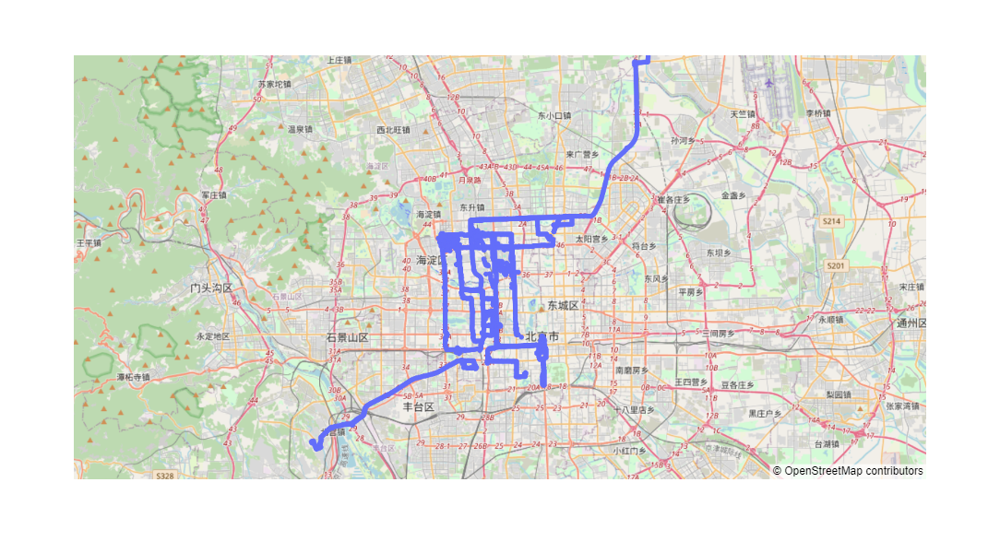

In [14]:
import plotly.express as px
import pandas as pd
fig = px.scatter_mapbox(lis, lat='lat', lon='long', zoom=10)

# Update layout to use Mapbox
fig.update_layout(mapbox_style="open-street-map", mapbox_zoom=10, mapbox_center={"lat": lis['lat'].mean(), "lon": lis['long'].mean()},width = 1300,height = 600)

# Show the plot
fig.show()

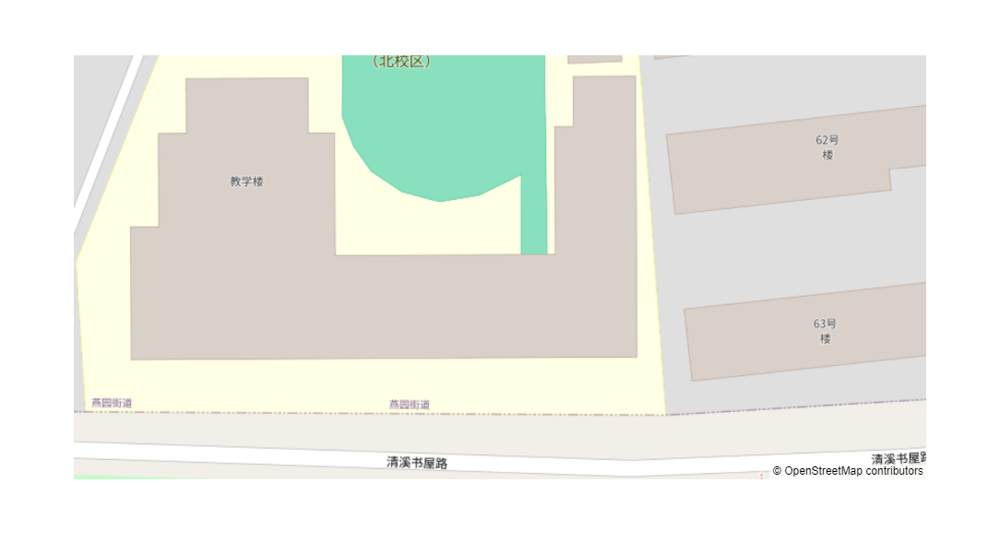

In [40]:
df = pd.read_csv(r"C:\Users\Deepanshu Sharma\Desktop\geolife\output\051.csv")
df = df[df['path number'] == 4]
fig = px.scatter_mapbox(df, lat='lat', lon='long', zoom=10)

fig.update_layout(mapbox_style="open-street-map", mapbox_zoom=10, mapbox_center={"lat": df['lat'].mean(), "lon": df['long'].mean()},width = 1300,height = 600)

fig.show()

In [41]:
df

,Unnamed: 0,lat,long,altitude,datetime,timedelta,distance,velocity,acceleration,trajectory_id,labels,v_ave,v_med,v_max,a_ave,a_med,a_max,path number
235,235,39.992023,116.297227,0,2007-12-10 13:05:17,0 days 00:00:01,6.912328,6.912328,-3.382953,20071210130517,NaN,2.476706,1.827399,6.912328,-0.656622,-0.258195,0.100878,4
236,236,39.992085,116.297238,0,2007-12-10 13:05:18,0 days 00:00:03,10.588125,3.529375,-0.617764,20071210130517,NaN,2.476706,1.827399,6.912328,-0.656622,-0.258195,0.100878,4
237,237,39.992178,116.297263,0,2007-12-10 13:05:21,0 days 00:00:03,5.028245,1.676082,0.100878,20071210130517,NaN,2.476706,1.827399,6.912328,-0.656622,-0.258195,0.100878,4
238,238,39.992223,116.297270,0,2007-12-10 13:05:24,0 days 00:00:24,47.489175,1.978716,0.081196,20071210130517,NaN,2.476706,1.827399,6.912328,-0.656622,-0.258195,0.100878,4
239,239,39.991813,116.297112,0,2007-12-10 13:05:48,0 days 00:00:05,19.637114,3.927423,-0.481302,20071210130517,NaN,2.476706,1.827399,6.912328,-0.656622,-0.258195,0.100878,4
240,240,39.991643,116.297175,0,2007-12-10 13:05:53,0 days 00:00:05,7.604573,1.520915,-0.258195,20071210130517,NaN,2.476706,1.827399,6.912328,-0.656622,-0.258195,0.100878,4
241,241,39.991575,116.297182,0,2007-12-10 13:05:58,0 days 00:00:05,1.149687,0.229937,-0.038213,20071210130517,NaN,2.476706,1.827399,6.912328,-0.656622,-0.258195,0.100878,4
242,242,39.991577,116.297168,0,2007-12-10 13:06:03,0 days 00:04:00,9.329532,0.038873,NaN,20071210130517,NaN,2.476706,1.827399,6.912328,-0.656622,-0.258195,0.100878,4
243,243,39.991657,116.297135,0,2007-12-10 13:10:03,NaN,NaN,NaN,NaN,20071210130517,NaN,2.476706,1.827399,6.912328,-0.656622,-0.258195,0.100878,4


In [44]:
geod.inv(116.297168,39.991577,116.2974694983522,39.9916043)[2]

25.927072314524427

In [58]:
import requests

# Foursquare API credentials
CLIENT_ID = 'Demokey1'
CLIENT_SECRET = 'fsq3n66zimyJIhB3QvPfYWYBuadOhuBIsDPibCW2OnAlUP4='
VERSION = '20240330'  # Replace with current date in YYYYMMDD format

latitude = 40.7128  
longitude = -74.0060 

radius = 100 

# Foursquare API endpoint for venue search
url = f'https://api.foursquare.com/v2/venues/search?client_id={CLIENT_ID}&client_secret={CLIENT_SECRET}&v={VERSION}&ll={latitude},{longitude}&radius={radius}'

# Make the API request
response = requests.get(url)

# Check if the request was successful
if response.status_code == 200:
    # Parse the JSON response
    venues = response.json()['response']['venues']
    
    # Print details of each venue found
    for venue in venues:
        name = venue['name']
        address = venue['location'].get('address', 'Address not available')
        city = venue['location'].get('city', 'City not available')
        state = venue['location'].get('state', 'State not available')
        country = venue['location'].get('country', 'Country not available')
        postal_code = venue['location'].get('postalCode', 'Postal code not available')
        category = venue['categories'][0]['name'] if venue['categories'] else 'Category not available'
        
        print("Name:", name)
        print("Address:", address)
        print("City:", city)
        print("State:", state)
        print("Country:", country)
        print("Postal Code:", postal_code)
        print("Category:", category)
        print()  # Print a newline for readability
else:
    print("Error:", response.status_code)


Error: 400


In [62]:
import requests

# Foursquare API credentials
CLIENT_ID = 'IIKCD1EUBZHEBLPF01PDKEAVWPAMRB552Y4UMOO2KKGCPIE4'
CLIENT_SECRET = '5TLOQGJKQJ23BK3BT0YXGAIVV1NSKUDEKVYKMX3ZZ15CWMB2'
VERSION = '20180604'  # Replace with current date in YYYYMMDD format

# Coordinates of the location you want to search around
latitude = 40.7128  # Example latitude (New York City)
longitude = -74.0060  # Example longitude (New York City)

# Radius in meters to search within
radius = 500  # Example radius (1000 meters)

# Foursquare API endpoint for venue search
url = f'https://api.foursquare.com/v2/venues/explore?client_id={CLIENT_ID}&client_secret={CLIENT_SECRET}&v={VERSION}&ll={latitude},{longitude}&radius={radius}'

# Make the API request
response = requests.get(url)

# Check if the request was successful
venues = response.json()['response']

In [64]:
print(response)

<Response [410]>


In [86]:
CLIENT_ID = 'IIKCD1EUBZHEBLPF01PDKEAVWPAMRB552Y4UMOO2KKGCPIE4'
CLIENT_SECRET = '03QURNE2XJCJOQWHACJCDL3BNBAHLSKKXYIO1JMUIFMFUBON'
VERSION = 20240330
radius = 500
LIMIT = 100

In [87]:
lat = 40.7128  # Example latitude (New York City)
lng = -74.0060

In [88]:
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)

In [89]:
results = requests.get(url).json()["response"]['groups'][0]['items']

KeyError: 'groups'

In [85]:
requests.get(url)

<Response [410]>

In [80]:
results

[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '57f0689d498e7d49d9189369',
   'name': 'The Bar Room at Temple Court',
   'location': {'address': '123 Nassau St',
    'lat': 40.7114477287544,
    'lng': -74.00680157032005,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.7114477287544,
      'lng': -74.00680157032005}],
    'distance': 165,
    'postalCode': '10038',
    'cc': 'US',
    'neighborhood': 'Financial District',
    'city': 'New York',
    'state': 'NY',
    'country': 'United States',
    'formattedAddress': ['123 Nassau St',
     'New York, NY 10038',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d1d5941735',
     'name': 'Hotel Bar',
     'pluralName': 'Hotel Bars',
     'shortName': 'Hotel Bar',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/travel/hotel_bar_',
      'suffix': '.png'},
     'categoryCode': 13

In [1]:
40.00807332857755 -40.006931


0.0011423285775506997

In [2]:
116.3275253619233 - 116.321988

0.005537361923302342

In [39]:
lis

,lat,long,datetime,timedelta,distance,velocity,cl
0,39.974063,116.330038,2008-05-23 01:41:53,0 days 00:00:01,20.102538,20.102538,-1
1,39.973885,116.330081,2008-05-23 01:41:54,0 days 00:00:02,9.768523,4.884261,-1
2,39.973972,116.330064,2008-05-23 01:41:56,0 days 00:00:02,4.179585,2.089793,-1
3,39.974009,116.330055,2008-05-23 01:41:58,0 days 00:03:43,150.352485,0.674226,-1
4,39.975352,116.330280,2008-05-23 01:45:41,0 days 00:00:02,0.444137,0.222068,0
...,...,...,...,...,...,...,...
11832,40.007087,116.322233,2008-05-23 15:53:55,0 days 00:00:02,0.280138,0.140069,86
11833,40.007085,116.322231,2008-05-23 15:53:57,0 days 00:00:02,2.050853,1.025427,86
11834,40.007069,116.322243,2008-05-23 15:53:59,0 days 00:00:02,0.560276,0.280138,86
11835,40.007073,116.322239,2008-05-23 15:54:01,0 days 00:00:02,0.477083,0.238541,86


In [22]:
tdf = lis.copy()

In [23]:
tdf = tdf.reset_index()

In [24]:
tdf

,index,lat,long,datetime,timedelta,distance,velocity,luster
0,1464,39.974063,116.330038,2008-05-23 01:41:53,0 days 00:00:01,20.102538,20.102538,None
1,1465,39.973885,116.330081,2008-05-23 01:41:54,0 days 00:00:02,9.768523,4.884261,None
2,1466,39.973972,116.330064,2008-05-23 01:41:56,0 days 00:00:02,4.179585,2.089793,7
3,1467,39.974009,116.330055,2008-05-23 01:41:58,0 days 00:03:43,150.352485,0.674226,None
4,1468,39.975352,116.330280,2008-05-23 01:45:41,0 days 00:00:02,0.444137,0.222068,None
...,...,...,...,...,...,...,...,...
11837,13301,40.007060,116.322211,2008-05-23 15:54:05,0 days 00:00:02,1.806785,0.903393,None
11838,13302,40.007062,116.322190,2008-05-23 15:54:07,0 days 00:07:10,22.133437,0.051473,None
11839,13303,40.006940,116.321985,2008-05-23 16:01:17,0 days 00:00:02,1.031621,0.515811,None
11840,13304,40.006931,116.321988,2008-05-23 16:01:19,NaN,NaN,NaN,None


In [7]:
ddf = pd.concat(lis, ignore_index = True)

In [128]:
df = pd.read_csv(r"C:\Users\Deepanshu Sharma\Desktop\geolife\output\081.csv", usecols = ['lat','long','path number'])

In [ ]:
import plotly.express as px
import pandas as pd
fig = px.scatter_mapbox(ddf, lat='lat', lon='long', color='cluster',  # Change 'Color_Column' to the column name containing color information
                        color_continuous_scale=px.colors.cyclical.IceFire, zoom=10)

# Update layout to use Mapbox
fig.update_layout(mapbox_style="open-street-map", mapbox_zoom=10, mapbox_center={"lat": dt['lat'].mean(), "lon": dt['long'].mean()},width = 1300,height = 600)

# Show the plot
fig.show()

In [129]:
import folium
from folium.plugins import HeatMap
# Sample data
coordinates = list(zip(df['lat'],df['long']))

# Create a Folium map centered on the mean of the coordinates
mymap = folium.Map(location=[df['lat'].mean(), 
                             df['long'].mean()], 
                   zoom_start=3)
# hl = HeatMap(coordinates)
# mymap.add_child(hl)
# Add markers for each coordinate
# for i in df.index.values:
#     folium.Marker((df.iloc[i]['lat'],df.iloc[i]['long'])).add_to(mymap)
for index, row in df.iterrows():
    idx = row['path number']
    folium.Marker(location=[row['lat'], row['long']], popup=row['path number'] , icon=folium.Icon(color=f'#{idx*10+5}0A0A', prefix='fa')).add_to(mymap)

# Save the map to an HTML file
mymap.save(r"C:\Users\Deepanshu Sharma\Desktop\new21.html")


C:\Users\Deepanshu Sharma\AppData\Local\Temp\ipykernel_4296\1886789429.py:17: UserWarning: color argument of Icon should be one of: {'gray', 'green', 'lightgreen', 'black', 'beige', 'red', 'lightred', 'orange', 'lightblue', 'blue', 'lightgray', 'darkblue', 'white', 'darkred', 'cadetblue', 'pink', 'darkpurple', 'purple', 'darkgreen'}.
  folium.Marker(location=[row['lat'], row['long']], popup=row['path number'] , icon=folium.Icon(color=f'#{idx*10+5}0A0A', prefix='fa')).add_to(mymap)


In [ ]:
!pip install plotly

import plotly.express as px
import pandas as pd

# Load your large dataset containing latitude and longitude columns
df = pd.read_csv(r"C:\Users\Deepanshu Sharma\Desktop\geolife\output\021.csv", usecols = ['lat','long','path number','datetime'])
# Sample a subset of data or perform any necessary preprocessing/aggregation
# For example, you can sample 1000 random rows
# df_sampled = df.sample(n=1000)

# Create a scatter plot on Mapbox using Plotly Express
fig = px.scatter_mapbox(df, lat='lat', lon='long', color='path number',color_continuous_scale=px.colors.cyclical.IceFire, zoom=10)

# Update layout to use Mapbox
fig.update_layout(mapbox_style="open-street-map", mapbox_zoom=10, mapbox_center={"lat": df['lat'].mean(), "lon": df['long'].mean()},width = 1300,height = 600)

# Show the plot
fig.show()


In [ ]:
from sklearn.cluster import OPTICS
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Load your geographical coordinate data
# Replace 'your_data.csv' with the path to your dataset containing latitude and longitude columns
data = pd.read_csv(r"C:\Users\Deepanshu Sharma\Desktop\geolife\output\081.csv")

# Select latitude and longitude columns
X = data[['lat', 'long']]

# Scale the data (optional but recommended)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply OPTICS clustering
clustering = OPTICS(min_samples=5, xi=0.05, min_cluster_size=0.1).fit(X_scaled)

# Get cluster labels
labels = clustering.labels_

# Add cluster labels to the original DataFrame
data['cluster'] = labels

In [1]:
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN

df = pd.read_csv(r"C:\Users\Deepanshu Sharma\Desktop\geolife\output\081.csv")

X = df[['lat', 'long']].values

dbscan = DBSCAN(eps=0.1, min_samples=5) 
dbscan.fit(X)

labels = dbscan.labels_

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

Estimated number of clusters: 1
Estimated number of noise points: 0


In [2]:
dt = df
dt['cluster']=labels 
# Output clustered data

In [3]:
print(dt['cluster'].value_counts())

cluster
0    44252
Name: count, dtype: int64


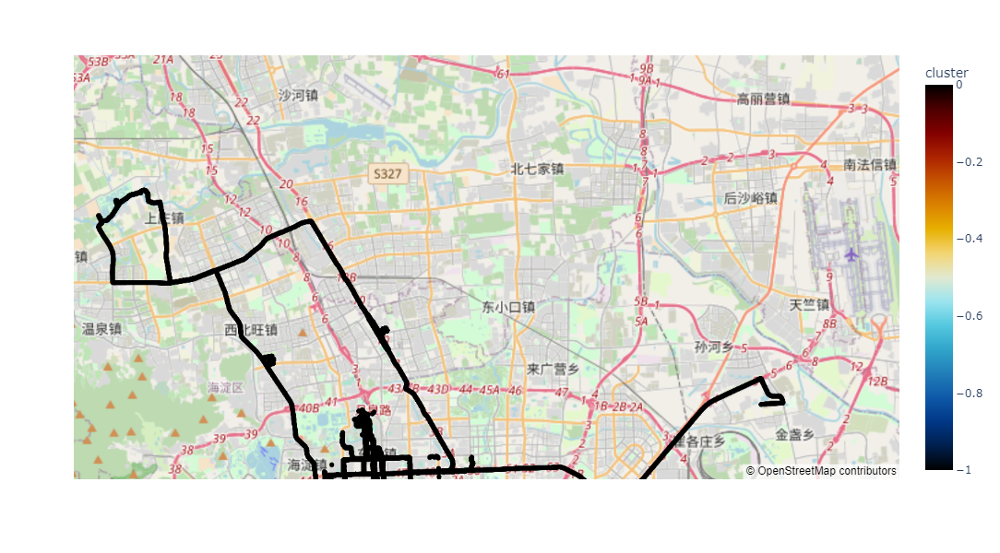

In [13]:
import plotly.express as px
import pandas as pd
fig = px.scatter_mapbox(dt, lat='lat', lon='long', color='cluster',  # Change 'Color_Column' to the column name containing color information
                        color_continuous_scale=px.colors.cyclical.IceFire, zoom=10)

# Update layout to use Mapbox
fig.update_layout(mapbox_style="open-street-map", mapbox_zoom=10, mapbox_center={"lat": dt['lat'].mean(), "lon": dt['long'].mean()},width = 1300,height = 600)

# Show the plot
fig.show()

In [5]:
def stayPointExtraction(file, distThres = 1, timeThres = 1):
    sp_df =[]
    df = pd.read_csv (file,usecols= ['distance','timedelta','path number','lat','long','datetime','velocity'])


    for pn in range (df['path number'].max() + 1):
        tdf = df [df['path number'] == pn].drop(['path number'], axis = 1)
        # for i in tdf.index.values :


        pointNum = len (tdf)
        i = 0
        while i < pointNum-1: 
            j = i+1
            while j < pointNum:   
                vel = tdf.iloc[j]['velocity']

                if vel > velThres:
                    # deltaT = tdf.iloc[i]['timedelta']
                    # days, time = deltaT.split(' days ')
                    # hours, minutes, seconds = time.split(':')
                    # total_seconds = int(days) * 24 * 60 * 60 + int(hours) * 60 * 60 + int(minutes) * 60 + int(seconds)
                    # if total_seconds > timeThres:
                    #     sp = pd.DataFrame()
                    #     sp['laltitude'], sp['longitude'] = [tdf[i:j+1]['lat'].mean()] , tdf[i:j+1]['long'].mean()
                    #     sp['arrivTime'], sp['leaveTime'] = tdf.iloc[i]['datetime'], tdf.iloc[j]['datetime']
                    #     print(sp)
                    #     sp_df.append(sp)
                    if df.iloc[j]['velocity'] > timeThres:
                        sp = pd.DataFrame()
                        sp['laltitude'], sp['longitude'] = [tdf[i:j+1]['lat'].mean()] , tdf[i:j+1]['long'].mean()
                        sp['arrivTime'], sp['leaveTime'] = tdf.iloc[i]['datetime'], tdf.iloc[j]['datetime']
                        sp['dist'] = dist
                        print(sp)
                        sp_df.append(sp)
                    i = j
                    break
                j += 1
            # Algorithm in [1] lacks following line
            i += 1
    return sp_df

In [13]:
import pandas as pd
df = pd.read_csv(r"C:\Users\Deepanshu Sharma\Desktop\geolife\output\081.csv")

In [14]:
df = df[df['path number'] == 6]

In [20]:
df  = df.reset_index(drop = True)

In [23]:
df[['lat' , 'long']].sample(35)

,lat,long
4237,40.100491,116.183738
4573,40.101714,116.182985
5033,40.094629,116.173317
8878,39.975704,116.327708
10958,40.006946,116.322081
3021,40.101261,116.203454
9030,39.994715,116.326878
6625,40.052044,116.323747
1949,40.033523,116.270122
10749,40.006855,116.321936
